In [31]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, BayesianRidge, PoissonRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import openpyxl
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler

warnings.filterwarnings('ignore')


In [32]:
# Load the dataset
    file_path = 'Cotton.xlsx'
    data = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert the date column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Extract the year, day, and month from the date column
data['year'] = data['date'].dt.year
data['day'] = data['date'].dt.day
data['month'] = data['date'].dt.month

# Filter data for years 2013-2016 and 2017
data_2013_2016 = data[(data['year'] >= 2013) & (data['year'] <= 2016)]
data_2017 = data[data['year'] == 2017]

# Combine all data for training and testing
train_data = data_2013_2016
test_data = data_2017

# Define features and targets
X_train = train_data[['by_product_id', 'day', 'month', 'station_id']]
y_train_min = train_data['minimum']
y_train_max = train_data['maximum']

X_test = test_data[['by_product_id', 'day', 'month', 'station_id']]
y_test_min = test_data['minimum']
y_test_max = test_data['maximum']

print("Data loaded and prepared.")


Data loaded and prepared.


In [33]:
def train_evaluate_predict(X_train, y_train_min, y_train_max, X_test, y_test_min, y_test_max):
    results = []
    metrics = []

    models = {
        'Linear Regression': LinearRegression(),
        'Ridge Regression': Ridge(),
        'Lasso Regression': Lasso(),
        'Bayesian Regression': BayesianRidge(),
        'Poisson Regression': PoissonRegressor(),
        'Decision Tree Regression': DecisionTreeRegressor(),
        'Random Forest Regression': RandomForestRegressor(),
        'Gradient Boosting Regression': GradientBoostingRegressor(),
        'AdaBoost Regression': AdaBoostRegressor(),
        'XGBoost Regression': XGBRegressor(),
        'LightGBM Regression': LGBMRegressor(),
        'CatBoost Regression': CatBoostRegressor(verbose=0),
        # 'Support Vector Regression': SVR(),
        # 'Gaussian Process Regression': GaussianProcessRegressor(),
        'K-Nearest Neighbors Regression': KNeighborsRegressor()
    }

    for model_name, model in models.items():
        print(f"Training and evaluating model: {model_name}")
        model.fit(X_train, y_train_min)
        y_pred_min = model.predict(X_test)
        
        model.fit(X_train, y_train_max)
        y_pred_max = model.predict(X_test)
        
        train_pred_min = model.predict(X_train)
        train_pred_max = model.predict(X_train)
        
        for i in range(len(test_data)):
            row = test_data.iloc[i]
            results.append({
                'station_id': row['station_id'],
                'by_product_en': row['by_product_en'],
                'date': row['date'],  # Use date here
                'model': model_name,
                'predicted_min': y_pred_min[i],
                'predicted_max': y_pred_max[i],
                'actual_min': row['minimum'],
                'actual_max': row['maximum']
            })
        
        metrics.append({
            'model': model_name,
            'RMSE_Min_Test': mean_squared_error(y_test_min, y_pred_min, squared=False),
            'MAE_Min_Test': mean_absolute_error(y_test_min, y_pred_min),
            'R2_Min_Test': r2_score(y_test_min, y_pred_min),
            'R2_Min_Train': r2_score(y_train_min, train_pred_min),
            'RMSE_Max_Test': mean_squared_error(y_test_max, y_pred_max, squared=False),
            'MAE_Max_Test': mean_absolute_error(y_test_max, y_pred_max),
            'R2_Max_Test': r2_score(y_test_max, y_pred_max),
            'R2_Max_Train': r2_score(y_train_max, train_pred_max)
        })

    return pd.DataFrame(results), pd.DataFrame(metrics)


In [34]:
def evaluate_time_series_models(train_data, test_data):
    results = []
    metrics = []

    # Sort data by date
    train_data = train_data.sort_values('date')
    test_data = test_data.sort_values('date')

    if train_data.empty or test_data.empty:
        return pd.DataFrame(results), pd.DataFrame(metrics)

    y_train_min = train_data['minimum']
    y_train_max = train_data['maximum']
    y_test_min = test_data['minimum']
    y_test_max = test_data['maximum']

    print("Training and evaluating ARIMA model")
    try:
        arima_min = ARIMA(y_train_min, order=(5, 1, 0)).fit()
        arima_max = ARIMA(y_train_max, order=(5, 1, 0)).fit()

        y_pred_min_arima = arima_min.forecast(steps=len(y_test_min))
        y_pred_max_arima = arima_max.forecast(steps=len(y_test_max))

        train_pred_min_arima = arima_min.fittedvalues
        train_pred_max_arima = arima_max.fittedvalues
    except Exception as e:
        print(f"Skipping ARIMA model due to error: {e}")
        y_pred_min_arima, y_pred_max_arima = pd.Series(), pd.Series()
        train_pred_min_arima, train_pred_max_arima = pd.Series(), pd.Series()
    
    print("Training and evaluating SARIMA model")
    try:
        sarima_min = SARIMAX(y_train_min, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), method='powell').fit(disp=False)
        sarima_max = SARIMAX(y_train_max, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), method='powell').fit(disp=False)

        y_pred_min_sarima = sarima_min.forecast(steps=len(y_test_min))
        y_pred_max_sarima = sarima_max.forecast(steps=len(y_test_max))

        train_pred_min_sarima = sarima_min.fittedvalues
        train_pred_max_sarima = sarima_max.fittedvalues
    except Exception as e:
        print(f"Skipping SARIMA model due to error: {e}")
        y_pred_min_sarima, y_pred_max_sarima = pd.Series(), pd.Series()
        train_pred_min_sarima, train_pred_max_sarima = pd.Series(), pd.Series()

    print("Training and evaluating Prophet model")
    try:
        prophet_min_data = train_data[['date', 'minimum']].rename(columns={'date': 'ds', 'minimum': 'y'})
        prophet_max_data = train_data[['date', 'maximum']].rename(columns={'date': 'ds', 'maximum': 'y'})

        prophet_min = Prophet().fit(prophet_min_data)
        prophet_max = Prophet().fit(prophet_max_data)

        future_min = prophet_min.make_future_dataframe(periods=len(y_test_min), freq='D')
        future_max = prophet_max.make_future_dataframe(periods=len(y_test_max), freq='D')

        y_pred_min_prophet = prophet_min.predict(future_min)['yhat'][-len(y_test_min):]
        y_pred_max_prophet = prophet_max.predict(future_max)['yhat'][-len(y_test_max):]

        train_pred_min_prophet = prophet_min.predict(prophet_min_data)['yhat']
        train_pred_max_prophet = prophet_max.predict(prophet_max_data)['yhat']
    except Exception as e:
        print(f"Skipping Prophet model due to error: {e}")
        y_pred_min_prophet, y_pred_max_prophet = pd.Series(), pd.Series()
        train_pred_min_prophet, train_pred_max_prophet = pd.Series(), pd.Series()

    # Collect results
    for model_name, y_pred_min, y_pred_max, train_pred_min, train_pred_max in [
            ('ARIMA', y_pred_min_arima, y_pred_max_arima, train_pred_min_arima, train_pred_max_arima),
            ('SARIMA', y_pred_min_sarima, y_pred_max_sarima, train_pred_min_sarima, train_pred_max_sarima),      
            ('Prophet', y_pred_min_prophet, y_pred_max_prophet, train_pred_min_prophet, train_pred_max_prophet)]:
        
        if y_pred_min.empty or y_pred_max.empty:
            continue
        
        for i, (pred_min, pred_max) in enumerate(zip(y_pred_min, y_pred_max)):
            results.append({
                'station_id': test_data['station_id'].iloc[i],
                'by_product_en': test_data['by_product_en'].iloc[i],
                'date': test_data['date'].iloc[i],  # Use date here
                'model': model_name,
                'predicted_min': pred_min,
                'predicted_max': pred_max,
                'actual_min': y_test_min.iloc[i],
                'actual_max': y_test_max.iloc[i]
            })
        
        metrics.append({
            'model': model_name,
            'RMSE_Min_Test': mean_squared_error(y_test_min, y_pred_min, squared=False),
            'MAE_Min_Test': mean_absolute_error(y_test_min, y_pred_min),
            'R2_Min_Test': r2_score(y_test_min, y_pred_min),
            'RMSE_Max_Test': mean_squared_error(y_test_max, y_pred_max, squared=False),
            'MAE_Max_Test': mean_absolute_error(y_test_max, y_pred_max),
            'R2_Max_Test': r2_score(y_test_max, y_pred_max),
            'R2_Min_Train': r2_score(y_train_min, train_pred_min),
            'R2_Max_Train': r2_score(y_train_max, train_pred_max)
        })
    
    return pd.DataFrame(results), pd.DataFrame(metrics)

In [35]:
print("Starting regression model evaluation.")
results, metrics = train_evaluate_predict(X_train, y_train_min, y_train_max, X_test, y_test_min, y_test_max)

print("Starting time series model evaluation.")
ts_results, ts_metrics = evaluate_time_series_models(train_data, test_data)
results = pd.concat([results, ts_results], ignore_index=True)
metrics = pd.concat([pd.DataFrame(metrics), ts_metrics], ignore_index=True)

# Save results to Excel file
with pd.ExcelWriter('model_predictions_and_metrics.xlsx') as writer:
    results.to_excel(writer, sheet_name='Predicted Prices 2017', index=False)
    metrics.to_excel(writer, sheet_name='Model Performance Metrics', index=False)

print("Evaluation completed and results saved.")


Starting regression model evaluation.
Training and evaluating model: Linear Regression
Training and evaluating model: Ridge Regression
Training and evaluating model: Lasso Regression
Training and evaluating model: Bayesian Regression
Training and evaluating model: Poisson Regression
Training and evaluating model: Decision Tree Regression
Training and evaluating model: Random Forest Regression
Training and evaluating model: Gradient Boosting Regression
Training and evaluating model: AdaBoost Regression
Training and evaluating model: XGBoost Regression
Training and evaluating model: LightGBM Regression
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 159
[LightGBM] [Info] Number of data points in the train set: 38241, number of used features: 4
[LightGBM] [Info] Start training from sco

12:40:59 - cmdstanpy - INFO - Chain [1] start processing
12:41:03 - cmdstanpy - INFO - Chain [1] done processing
12:41:04 - cmdstanpy - INFO - Chain [1] start processing
12:41:08 - cmdstanpy - INFO - Chain [1] done processing


Evaluation completed and results saved.


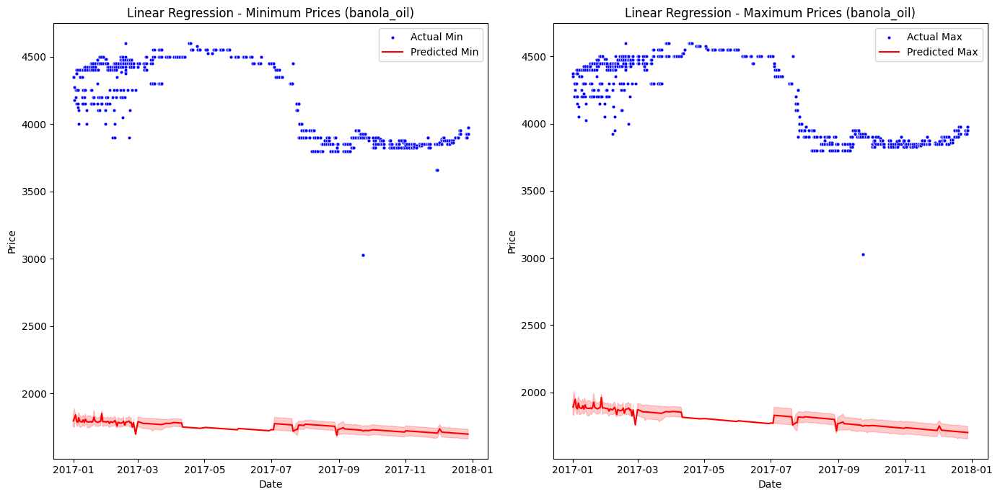

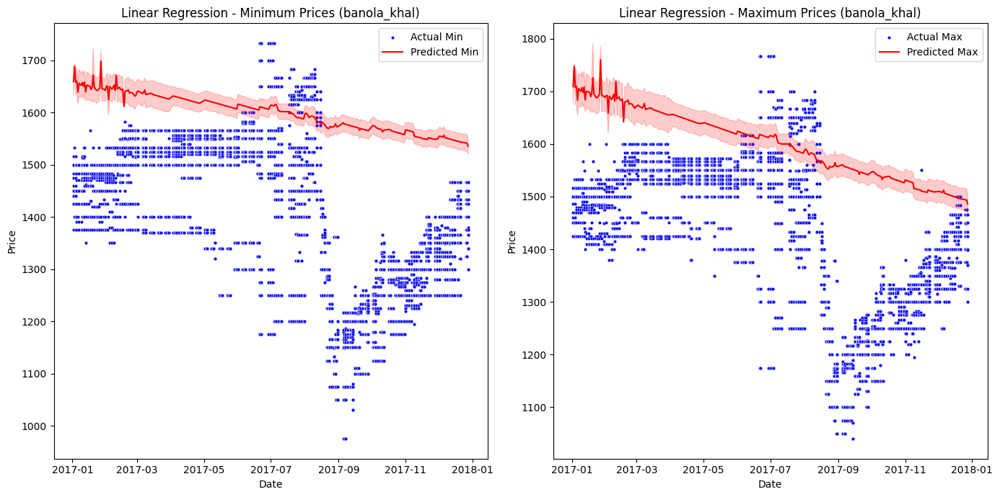

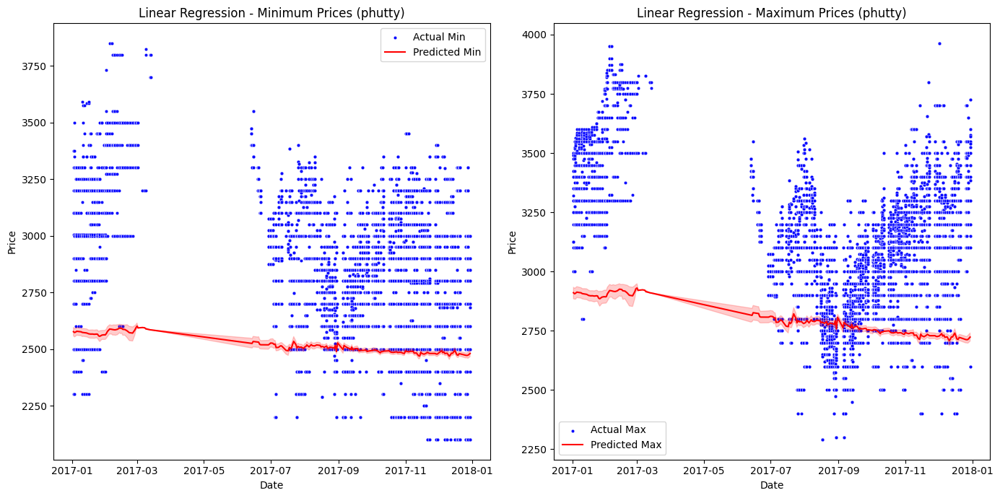

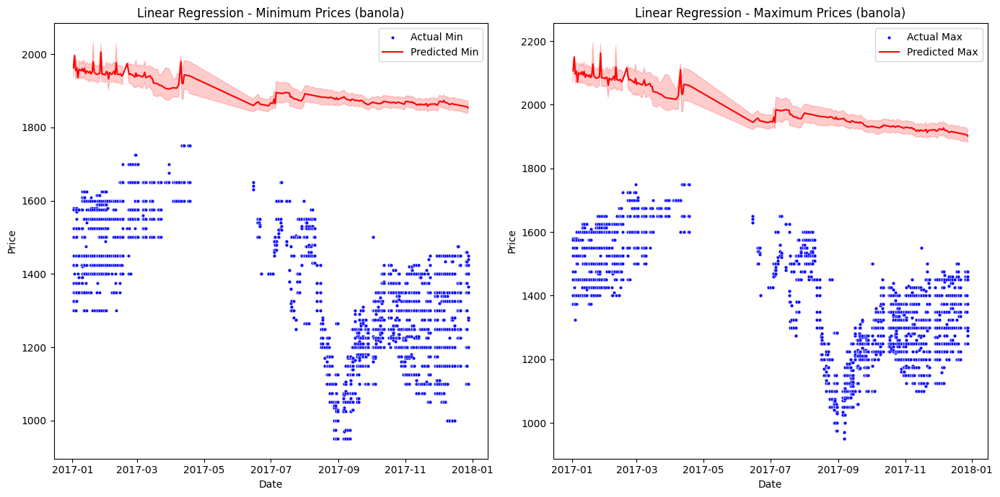

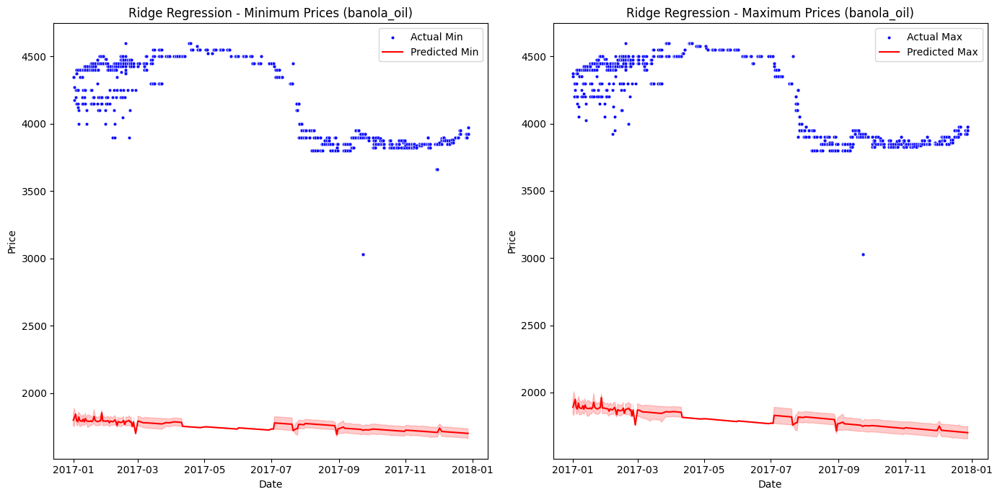

...

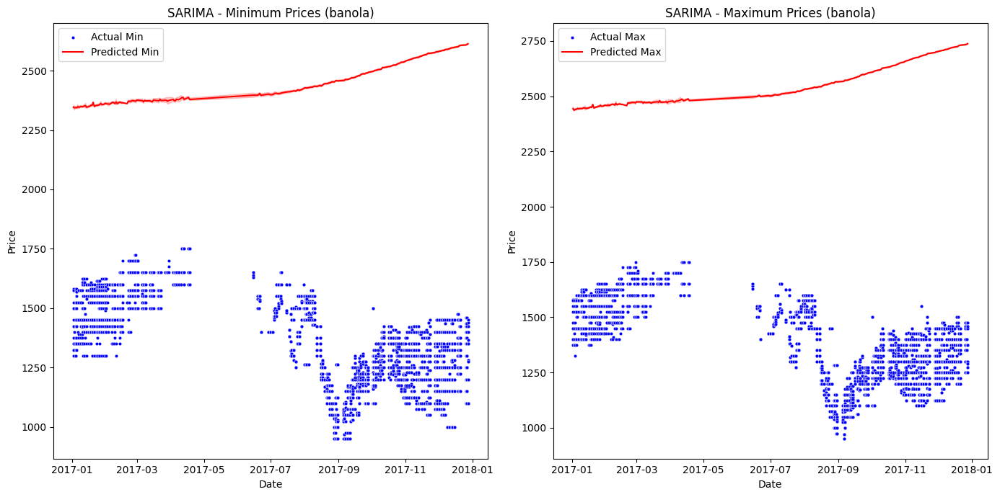

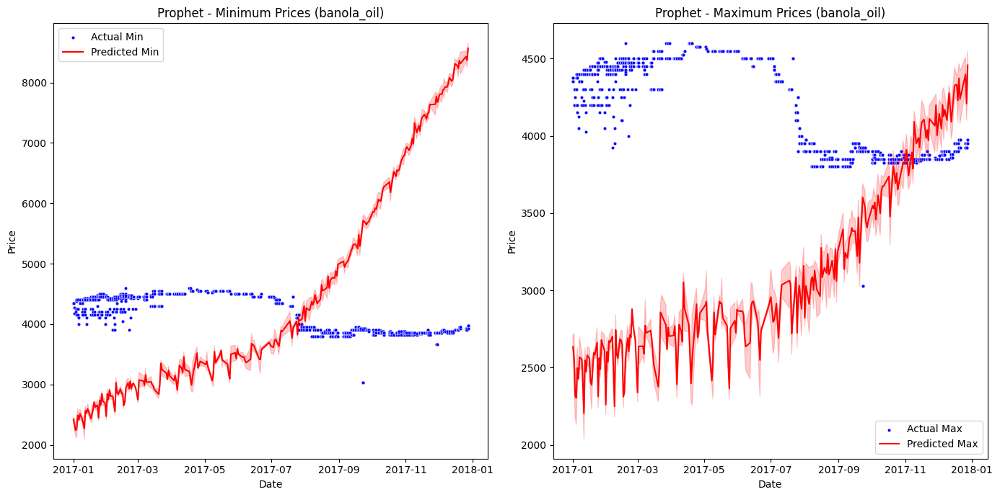

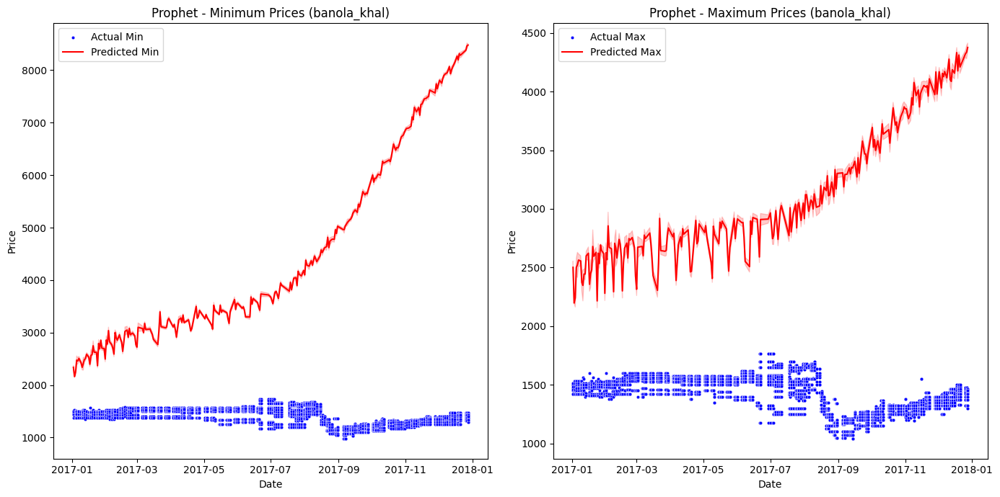

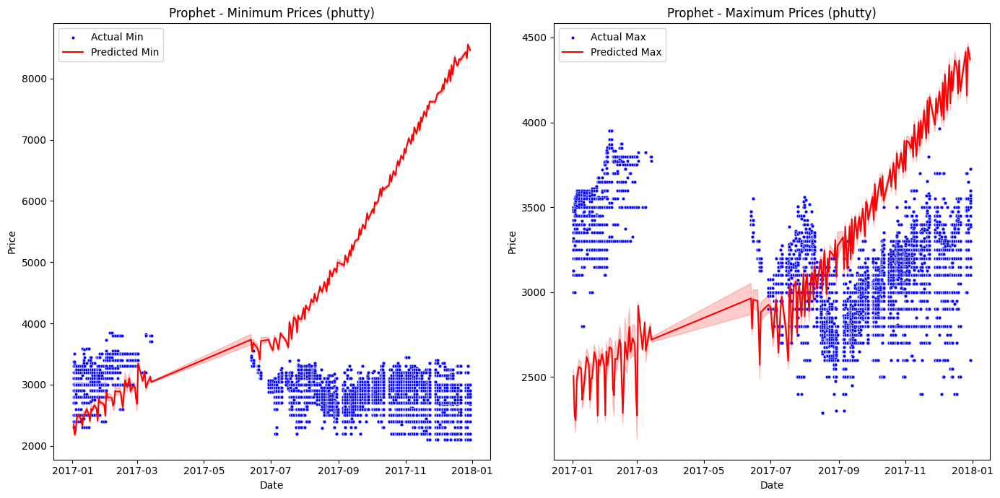

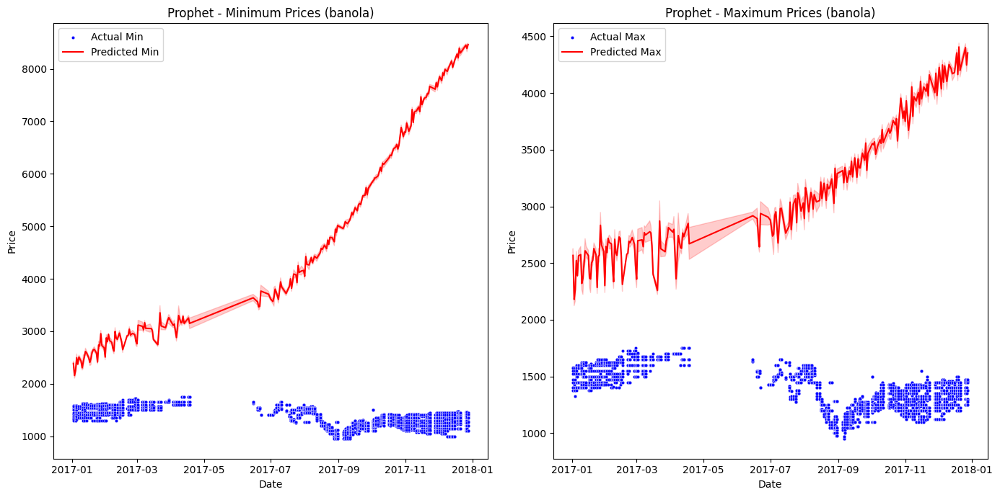

In [36]:
def plot_comparison_charts_by_product(results, model_name):
    filtered_results = results[results['model'] == model_name]
    by_products = filtered_results['by_product_en'].unique()
    
    for by_product in by_products:
        filtered_by_product = filtered_results[filtered_results['by_product_en'] == by_product]
        
        plt.figure(figsize=(14, 7))
        
        # Plot minimum prices
        plt.subplot(1, 2, 1)
        sns.scatterplot(x='date', y='actual_min', data=filtered_by_product, color='blue', label='Actual Min', s=10)
        sns.lineplot(x='date', y='predicted_min', data=filtered_by_product, color='red', label='Predicted Min')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title(f'{model_name} - Minimum Prices ({by_product})')
        plt.legend()
        
        # Plot maximum prices
        plt.subplot(1, 2, 2)
        sns.scatterplot(x='date', y='actual_max', data=filtered_by_product, color='blue', label='Actual Max', s=10)
        sns.lineplot(x='date', y='predicted_max', data=filtered_by_product, color='red', label='Predicted Max')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title(f'{model_name} - Maximum Prices ({by_product})')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

# Example usage with Linear Regression results
# plot_comparison_charts_by_product(results, 'Linear Regression')

# Loop through all models to plot their comparison charts for each by_product
for model in results['model'].unique():
    plot_comparison_charts_by_product(results, model)

In [40]:
# Scale the data for LSTM
scaler_X = MinMaxScaler()
scaler_y_min = MinMaxScaler()
scaler_y_max = MinMaxScaler()

X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
y_train_min_scaled = scaler_y_min.fit_transform(y_train_min.values.reshape(-1, 1))
y_train_max_scaled = scaler_y_max.fit_transform(y_train_max.values.reshape(-1, 1))
y_test_min_scaled = scaler_y_min.transform(y_test_min.values.reshape(-1, 1))
y_test_max_scaled = scaler_y_max.transform(y_test_max.values.reshape(-1, 1))

# Reshape for LSTM
X_train_scaled = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

In [41]:
# Define and compile the LSTM model
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(LSTM(50))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Train and evaluate the LSTM model
def train_evaluate_lstm(X_train, y_train_min, y_train_max, X_test, y_test_min, y_test_max):
    results = []
    metrics = []

    lstm_model_min = build_lstm_model((X_train.shape[1], X_train.shape[2]))
    lstm_model_max = build_lstm_model((X_train.shape[1], X_train.shape[2]))

    print("Training LSTM model for minimum prices...")
    lstm_model_min.fit(X_train, y_train_min, epochs=50, batch_size=32, verbose=0)
    y_pred_min = lstm_model_min.predict(X_test)

    print("Training LSTM model for maximum prices...")
    lstm_model_max.fit(X_train, y_train_max, epochs=50, batch_size=32, verbose=0)
    y_pred_max = lstm_model_max.predict(X_test)

    y_pred_min = scaler_y_min.inverse_transform(y_pred_min)
    y_pred_max = scaler_y_max.inverse_transform(y_pred_max)
    train_pred_min = scaler_y_min.inverse_transform(lstm_model_min.predict(X_train))
    train_pred_max = scaler_y_max.inverse_transform(lstm_model_max.predict(X_train))

    for i in range(len(test_data)):
        row = test_data.iloc[i]
        results.append({
            'station_id': row['station_id'],
            'by_product_en': row['by_product_en'],
            'date': row['date'],  # Use date here
            'model': 'LSTM',
            'predicted_min': y_pred_min[i, 0],
            'predicted_max': y_pred_max[i, 0],
            'actual_min': row['minimum'],
            'actual_max': row['maximum']
        })

    metrics.append({
        'model': 'LSTM',
        'RMSE_Min_Test': mean_squared_error(y_test_min, y_pred_min, squared=False),
        'MAE_Min_Test': mean_absolute_error(y_test_min, y_pred_min),
        'R2_Min_Test': r2_score(y_test_min, y_pred_min),
        'R2_Min_Train': r2_score(y_train_min, train_pred_min),
        'RMSE_Max_Test': mean_squared_error(y_test_max, y_pred_max, squared=False),
        'MAE_Max_Test': mean_absolute_error(y_test_max, y_pred_max),
        'R2_Max_Test': r2_score(y_test_max, y_pred_max),
        'R2_Max_Train': r2_score(y_train_max, train_pred_max)
    })

    return pd.DataFrame(results), pd.DataFrame(metrics)

In [43]:
print("Starting LSTM model evaluation.")
lstm_results, lstm_metrics = train_evaluate_lstm(X_train_scaled, y_train_min_scaled, y_train_max_scaled, X_test_scaled, y_test_min_scaled, y_test_max_scaled)
results = pd.concat([results, lstm_results], ignore_index=True)
metrics = pd.concat([metrics, lstm_metrics], ignore_index=True)

# Save results to Excel file
with pd.ExcelWriter('LSTM.xlsx') as writer:
    results.to_excel(writer, sheet_name='Predicted Prices 2017', index=False)
    metrics.to_excel(writer, sheet_name='Model Performance Metrics', index=False)

print("Evaluation completed and results saved.")

Starting LSTM model evaluation.
Training LSTM model for minimum prices...
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 626us/step
Training LSTM model for maximum prices...
802/802 ━━━━━━━━━━━━━━━━━━━━ 1s 628us/step
1196/1196 ━━━━━━━━━━━━━━━━━━━━ 1s 435us/step
1196/1196 ━━━━━━━━━━━━━━━━━━━━ 1s 435us/step
Evaluation completed and results saved.


In [ ]:
def plot_comparison_charts_by_product(results, model_name):
    filtered_results = results[results['model'] == model_name]
    by_products = filtered_results['by_product_en'].unique()
    
    for by_product in by_products:
        filtered_by_product = filtered_results[filtered_results['by_product_en'] == by_product]
        
        plt.figure(figsize=(14, 7))
        
        # Plot minimum prices
        plt.subplot(1, 2, 1)
        sns.scatterplot(x='date', y='actual_min', data=filtered_by_product, color='blue', label='Actual Min', s=10)
        sns.lineplot(x='date', y='predicted_min', data=filtered_by_product, color='red', label='Predicted Min')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title(f'{model_name} - Minimum Prices ({by_product})')
        plt.legend()
        
        # Plot maximum prices
        plt.subplot(1, 2, 2)
        sns.scatterplot(x='date', y='actual_max', data=filtered_by_product, color='blue', label='Actual Max', s=10)
        sns.lineplot(x='date', y='predicted_max', data=filtered_by_product, color='red', label='Predicted Max')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title(f'{model_name} - Maximum Prices ({by_product})')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

# Example usage with LSTM results
plot_comparison_charts_by_product(results, 'LSTM')

# Loop through all models to plot their comparison charts for each by_product
for model in results['model'].unique():
    plot_comparison_charts_by_product(results, model)